# Лабораторная работа №8 (Проведение исследований с моделями обнаружения и распознавания объектов)

## Выбор начальных условий

### Обоснование выбора набора данных
Разработка системы распознавания животных представляет собой критически важную задачу в области сохранения биоразнообразия. Наш проект направлен на создание высокоточной технологии компьютерного зрения, способной идентифицировать различные виды фауны в естественной среде обитания. Данная технология имеет многогранное практическое применение: от защиты исчезающих видов через непрерывный мониторинг популяций до выявления незаконной охотничьей деятельности посредством автоматического анализа фотоловушек. Не менее важна роль такой системы в поддержании безопасности — она помогает предупреждать о потенциально опасных ситуациях при взаимодействии человека с дикой природой в заповедниках.

### Выбор метрики
В рамках проекта по детекции животных с использованием архитектуры YOLO ключевую роль играет корректная оценка эффективности модели. В качестве основного критерия качества выбрана метрика mAP (средняя средняя точность), которая обеспечивает комплексную оценку производительности детектора при работе с многоклассовой классификацией, что идеально соответствует задаче распознавания разнообразной фауны. Эта метрика особенно ценна для нашего применения, так как учитывает не только правильность идентификации животного, но и точность определения его местоположения на изображении. Для всестороннего анализа работы модели мы также используем дополнительные показатели: точность (Precision), полноту (Recall) и коэффициент пересечения (IoU). Это позволяет найти оптимальный баланс между двумя критическими типами ошибок — пропуском редких видов (что может навредить природоохранным усилиям) и ложными тревогами (ведущими к неэффективному использованию ресурсов).


## Подготовка данных

Импортируем основные библиотеки, которые будем использовать для обработки данных и создания модели.

In [2]:
import kagglehub
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from PIL import Image
import shutil
import yaml
from tqdm.auto import tqdm
import cv2
from matplotlib.patches import Rectangle
import pandas as pd
import glob
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.applications import MobileNetV2

Загружаем датасет и устанавливаем значения констант

In [3]:
DATASET_PATH = kagglehub.dataset_download("ankanghosh651/object-detection-wildlife-dataset-yolo-format")

In [4]:
! ls "/home/jupyter/.cache/kagglehub/datasets/ankanghosh651/object-detection-wildlife-dataset-yolo-format/versions/1"

data.yaml
final_data


In [5]:
YAML_PATH = os.path.join(DATASET_PATH, "data.yaml")
DATASET_PATH = os.path.join(DATASET_PATH, "final_data")

Создание структуры директорий для YOLO

In [6]:
classes = {
    0: 'buffalo',
    1: 'elephant',
    2: 'rhino',
    3: 'zebra',
}
with open(YAML_PATH, 'w') as f:
    yaml_content = {
        'path': os.path.abspath(DATASET_PATH),
        'train': 'train/images',
        'val': 'valid/images',
        'nc': len(classes),
        'names': classes
    }
    yaml.dump(yaml_content, f, default_flow_style=False)


Проверка подготовленного датасета

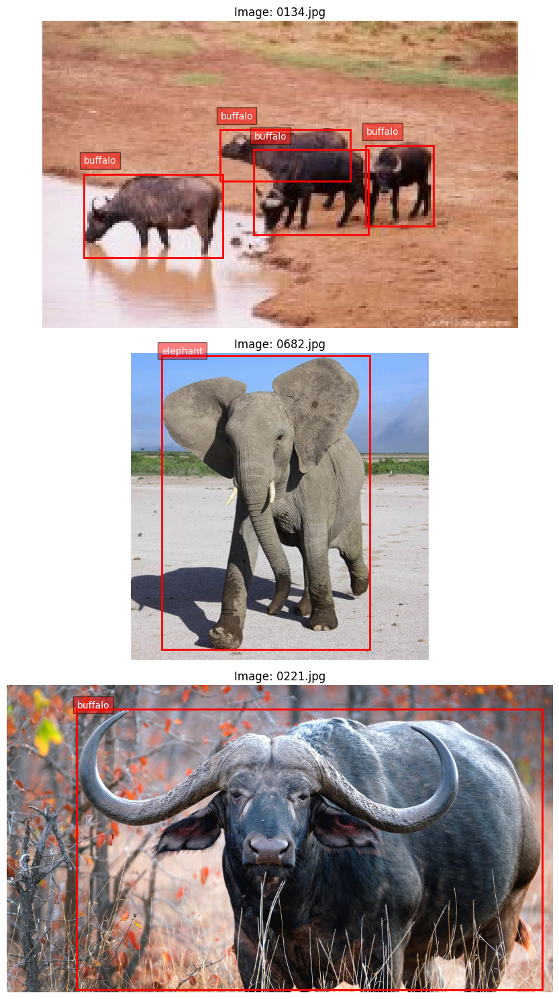

In [7]:
def visualize_dataset_samples(output_path, num_samples=3):
    with open(YAML_PATH, 'r') as f:
        data_config = yaml.safe_load(f)
        class_names = data_config['names']

    images_dir = os.path.join(output_path, 'train', 'images', )
    labels_dir = os.path.join(output_path, 'train', 'labels')

    all_images = os.listdir(images_dir)
    random.seed(123)
    sample_images = random.sample(all_images, min(num_samples, len(all_images)))

    plt.figure(figsize=(15, 5 * num_samples))

    for i, img_file in enumerate(sample_images):
        img_path = os.path.join(images_dir, img_file)
        label_path = os.path.join(labels_dir, img_file.replace('.jpg', '.txt'))

        # Загружаем изображение
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        height, width, _ = img.shape

        # Создаем подграфик
        plt.subplot(num_samples, 1, i+1)
        plt.imshow(img)

        # Загружаем и отображаем разметку
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.read().strip().split('\n')

                for line in lines:
                    parts = line.strip().split()
                    if len(parts) == 5:
                        class_id, x_center, y_center, w, h = map(float, parts)

                        # Преобразуем нормализованные координаты в пиксели
                        x_center *= width
                        y_center *= height
                        w *= width
                        h *= height

                        # Вычисляем координаты верхнего левого угла
                        x1 = x_center - w/2
                        y1 = y_center - h/2

                        # Добавляем прямоугольник на изображение
                        rect = Rectangle((x1, y1), w, h,
                                        linewidth=2, edgecolor='r', facecolor='none')
                        plt.gca().add_patch(rect)

                        # Добавляем подпись с классом
                        class_name = class_names[int(class_id)]
                        plt.text(x1, y1-5, class_name,
                                color='white', fontsize=10,
                                bbox=dict(facecolor='red', alpha=0.5))

        plt.title(f"Image: {img_file}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

visualize_dataset_samples(DATASET_PATH)


## YOLO

### Обычный бейзлайн

Создаём модель, загружаем на gpu

In [44]:
model = YOLO("yolo11n.pt")

In [47]:
results = model.train(
    data=YAML_PATH,
    epochs=10,
    imgsz=640,
    batch=16,
    patience=10,
    device=0,  # GPU
    project='african_wildlife_detection',
    name=f'yolov11_training',
    save=True,
    plots=True
)


New https://pypi.org/project/ultralytics/8.3.130 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/jupyter/.cache/kagglehub/datasets/ankanghosh651/object-detection-wildlife-dataset-yolo-format/versions/1/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937

train: Scanning /home/jupyter/.cache/kagglehub/datasets/ankanghosh651/object-detection-wildlife-dataset-yolo-format/versions/1/final_data/train/labels... 1203 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1203/1203 [00:00<00:00, 1285.47it/s]

train: New cache created: /home/jupyter/.cache/kagglehub/datasets/ankanghosh651/object-detection-wildlife-dataset-yolo-format/versions/1/final_data/train/labels.cache


albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 227.2±155.8 MB/s, size: 135.6 KB)


val: Scanning /home/jupyter/.cache/kagglehub/datasets/ankanghosh651/object-detection-wildlife-dataset-yolo-format/versions/1/final_data/valid/labels... 150 images, 0 backgrounds, 0 corrupt: 100%|██████████| 150/150 [00:00<00:00, 753.42it/s]

val: New cache created: /home/jupyter/.cache/kagglehub/datasets/ankanghosh651/object-detection-wildlife-dataset-yolo-format/versions/1/final_data/valid/labels.cache


Plotting labels to african_wildlife_detection/yolov11_training18/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to african_wildlife_detection/yolov11_training18
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      2.38G     0.7739      2.703      1.203         12        640: 100%|██████████| 76/76 [00:18<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.72it/s]

                   all        150        262      0.975      0.484      0.841      0.643



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      2.38G     0.9164      1.897      1.303          4        640: 100%|██████████| 76/76 [00:13<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.67it/s]


                   all        150        262      0.638      0.618        0.7       0.48

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      2.38G     0.9339      1.728      1.297          4        640: 100%|██████████| 76/76 [00:12<00:00,  5.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.46it/s]

                   all        150        262      0.711        0.7       0.78      0.529



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      2.38G      0.953       1.53      1.306          7        640: 100%|██████████| 76/76 [00:13<00:00,  5.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.85it/s]

                   all        150        262      0.818      0.701      0.816      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      2.38G     0.8879      1.334      1.262          6        640: 100%|██████████| 76/76 [00:13<00:00,  5.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.16it/s]

                   all        150        262      0.889        0.8      0.901      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      2.38G     0.8224      1.114      1.202          5        640: 100%|██████████| 76/76 [00:13<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.80it/s]


                   all        150        262      0.881      0.829      0.915      0.734

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      2.38G     0.7745      1.021      1.158          5        640: 100%|██████████| 76/76 [00:13<00:00,  5.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.54it/s]

                   all        150        262      0.927      0.829      0.914       0.73



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      2.38G     0.7256     0.8995      1.128          5        640: 100%|██████████| 76/76 [00:13<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.28it/s]

                   all        150        262      0.928      0.846      0.933      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      2.38G     0.6753     0.7838      1.087          3        640: 100%|██████████| 76/76 [00:12<00:00,  5.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.28it/s]

                   all        150        262      0.908      0.902      0.938      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      2.38G     0.6367     0.7417      1.063          5        640: 100%|██████████| 76/76 [00:12<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.24it/s]


                   all        150        262      0.943      0.913      0.955      0.809

10 epochs completed in 0.044 hours.
Optimizer stripped from african_wildlife_detection/yolov11_training18/weights/last.pt, 5.5MB
Optimizer stripped from african_wildlife_detection/yolov11_training18/weights/best.pt, 5.5MB

Validating african_wildlife_detection/yolov11_training18/weights/best.pt...
Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 100 layers, 2,582,932 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.73it/s]


                   all        150        262      0.941      0.914      0.955       0.81
               buffalo         38         60      0.914       0.88      0.914      0.782
              elephant         43         83       0.92      0.916      0.968      0.784
                 rhino         42         58      0.965      0.965      0.991      0.896
                 zebra         28         61      0.965      0.895      0.948       0.78
Speed: 0.8ms preprocess, 2.1ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to african_wildlife_detection/yolov11_training18


Валидация

In [48]:
val_results = model.val()
print(f"Validation Results:")
print(f"mAP@0.5: {val_results.box.map50:.4f}")
print(f"mAP@0.5:0.95: {val_results.box.map:.4f}")

# Вывод средних значений precision и recall
print(f"Average Precision: {np.mean(val_results.box.p):.4f}")
print(f"Average Recall: {np.mean(val_results.box.r):.4f}")

# Вывод precision и recall для каждого класса
print("\nPrecision по классам:")
for i, p in enumerate(val_results.box.p):
    class_name = val_results.names[i] if i in val_results.names else f"Класс {i}"
    print(f"  {class_name}: {p:.4f}")

print("\nRecall по классам:")
for i, r in enumerate(val_results.box.r):
    class_name = val_results.names[i] if i in val_results.names else f"Класс {i}"
    print(f"  {class_name}: {r:.4f}")


Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 100 layers, 2,582,932 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2087.8±766.5 MB/s, size: 152.6 KB)


val: Scanning /home/jupyter/.cache/kagglehub/datasets/ankanghosh651/object-detection-wildlife-dataset-yolo-format/versions/1/final_data/valid/labels.cache... 150 images, 0 backgrounds, 0 corrupt: 100%|██████████| 150/150 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.48it/s]


                   all        150        262      0.944      0.911      0.955      0.809
               buffalo         38         60      0.929      0.872      0.915      0.775
              elephant         43         83      0.936      0.916      0.967      0.782
                 rhino         42         58      0.945      0.966      0.991      0.899
                 zebra         28         61      0.965      0.891      0.946      0.781
Speed: 1.1ms preprocess, 14.4ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to african_wildlife_detection/yolov11_training182
Validation Results:
mAP@0.5: 0.9549
mAP@0.5:0.95: 0.8093
Average Precision: 0.9436
Average Recall: 0.9111

Precision по классам:
  buffalo: 0.9290
  elephant: 0.9359
  rhino: 0.9449
  zebra: 0.9645

Recall по классам:
  buffalo: 0.8718
  elephant: 0.9157
  rhino: 0.9655
  zebra: 0.8914


In [49]:
def visualize_predictions(model_path=None, num_images=5, conf_threshold=0.25):

    prediction_model = YOLO(model_path)
    test_folder = os.path.join(DATASET_PATH, "valid", "images")
    image_files = [f for f in os.listdir(test_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp'))]

    selected_images = random.sample(image_files, min(num_images, len(image_files)))

    fig, axes = plt.subplots(len(selected_images), 1, figsize=(12, 7 * len(selected_images)))
    if len(selected_images) == 1:
        axes = [axes]

    for i, img_file in enumerate(selected_images):
        img_path = os.path.join(test_folder, img_file)

        results = prediction_model.predict(img_path, conf=conf_threshold, save=False)[0]
        result_img = results.plot()
        axes[i].imshow(result_img)
        axes[i].set_title(f"Предсказания для {img_file}")
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

    return prediction_model



image 1/1 /home/jupyter/.cache/kagglehub/datasets/ankanghosh651/object-detection-wildlife-dataset-yolo-format/versions/1/final_data/valid/images/0369.jpg: 384x640 7 buffalos, 58.6ms
Speed: 1.4ms preprocess, 58.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /home/jupyter/.cache/kagglehub/datasets/ankanghosh651/object-detection-wildlife-dataset-yolo-format/versions/1/final_data/valid/images/0232.jpg: 448x640 2 buffalos, 53.4ms
Speed: 1.3ms preprocess, 53.4ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /home/jupyter/.cache/kagglehub/datasets/ankanghosh651/object-detection-wildlife-dataset-yolo-format/versions/1/final_data/valid/images/0614.jpg: 448x640 2 elephants, 6.7ms
Speed: 2.1ms preprocess, 6.7ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)


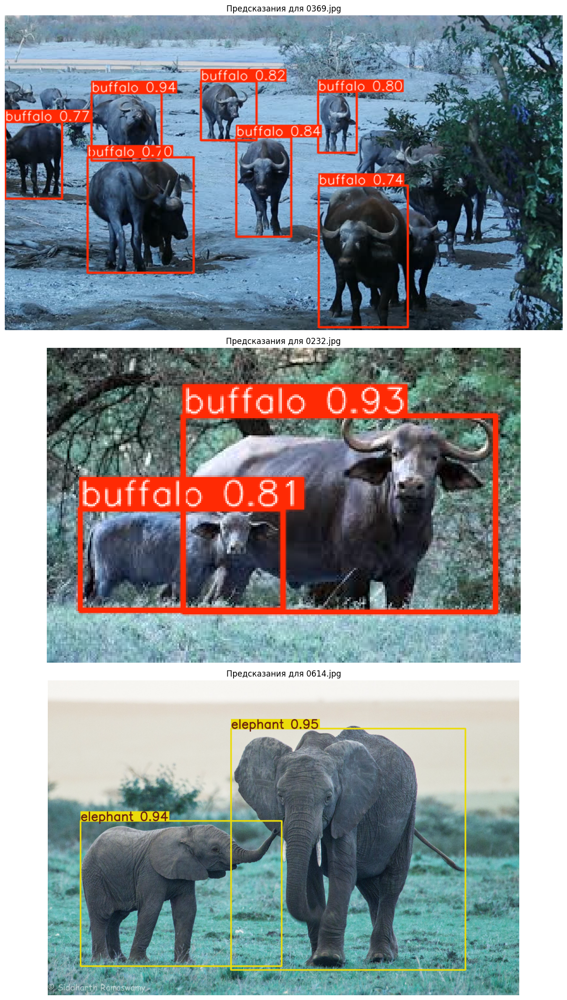

In [50]:
best_model_path = 'african_wildlife_detection/yolov11_training18/weights/best.pt'

prediction_model = visualize_predictions(
    model_path=best_model_path,
    num_images=3,
    conf_threshold=0.3
)

Визуально модель справляется крайне хорошо. Значения метрик тоже блазки к 1, что говорит о успешном примененеии модели. Можно попытаться пообучать её подольше и поиграться с параметрами, но кажется сильных улучшений уже болиться не получится

### Улучшенный бейзлайн

Для улучшения точности модели попробуем увеличить количество эпох, кажется что размер датасета позволяет ещё обучаться

In [51]:
def train_with_optimized_hyperparameters(epochs=20):
    model = YOLO(f"yolo11n.pt")
    hyperparameters = {
        'lr0': 0.01,
        'lrf': 0.01,
        'momentum': 0.937,
        'weight_decay': 0.0005,
        'warmup_epochs': 3.0,
        'warmup_momentum': 0.8,
        'box': 7.5,
        'cls': 0.5,
        'dfl': 1.5,
        'nbs': 64
    }

    results = model.train(
        data=YAML_PATH,
        epochs=epochs,
        imgsz=640,
        batch=16,
        patience=15,
        device=0,
        project='african_wildlife_detection',
        name=f'yolo11n_optimized',
        save=True,
        plots=True,
        **hyperparameters
    )

    return model, results


In [52]:
optimized_model, opt_results = train_with_optimized_hyperparameters(
    epochs=20
)

New https://pypi.org/project/ultralytics/8.3.130 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/home/jupyter/.cache/kagglehub/datasets/ankanghosh651/object-detection-wildlife-dataset-yolo-format/versions/1/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937

train: Scanning /home/jupyter/.cache/kagglehub/datasets/ankanghosh651/object-detection-wildlife-dataset-yolo-format/versions/1/final_data/train/labels.cache... 1203 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1203/1203 [00:00<?, ?it/s]

albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'


val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 183.9±103.0 MB/s, size: 135.6 KB)


val: Scanning /home/jupyter/.cache/kagglehub/datasets/ankanghosh651/object-detection-wildlife-dataset-yolo-format/versions/1/final_data/valid/labels.cache... 150 images, 0 backgrounds, 0 corrupt: 100%|██████████| 150/150 [00:00<?, ?it/s]


Plotting labels to african_wildlife_detection/yolo11n_optimized2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to african_wildlife_detection/yolo11n_optimized2
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      2.48G     0.8523      2.459      1.231         13        640: 100%|██████████| 76/76 [00:15<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.42it/s]

                   all        150        262      0.909      0.372      0.718      0.546



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      2.49G     0.9174      1.521       1.26         15        640: 100%|██████████| 76/76 [00:13<00:00,  5.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.11it/s]


                   all        150        262      0.825      0.728      0.823      0.611

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      2.49G     0.9527      1.372      1.275         16        640: 100%|██████████| 76/76 [00:13<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.76it/s]

                   all        150        262       0.72      0.635      0.724      0.506



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      2.49G     0.9652      1.332      1.287         14        640: 100%|██████████| 76/76 [00:13<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.66it/s]


                   all        150        262      0.788      0.762      0.851      0.586

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      2.49G     0.9376      1.225       1.28          6        640: 100%|██████████| 76/76 [00:13<00:00,  5.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.59it/s]

                   all        150        262       0.79       0.66       0.74      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      2.49G     0.8934      1.087      1.213         11        640: 100%|██████████| 76/76 [00:13<00:00,  5.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.35it/s]

                   all        150        262      0.928      0.776      0.906      0.699



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      2.49G     0.8659      1.042      1.214         12        640: 100%|██████████| 76/76 [00:13<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.75it/s]


                   all        150        262      0.899      0.769      0.886      0.696

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      2.49G     0.8508      0.989      1.204          9        640: 100%|██████████| 76/76 [00:13<00:00,  5.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.82it/s]

                   all        150        262      0.924      0.858      0.911      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      2.49G     0.8305     0.9278      1.188         30        640: 100%|██████████| 76/76 [00:13<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  3.88it/s]

                   all        150        262      0.895      0.876      0.943       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      2.49G     0.8167     0.8717       1.18          9        640: 100%|██████████| 76/76 [00:13<00:00,  5.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.20it/s]

                   all        150        262      0.917      0.873      0.944      0.772


Closing dataloader mosaic
albumentations: ImageCompression.__init__() got an unexpected keyword argument 'quality_range'

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      2.49G     0.7349      0.874      1.142          3        640: 100%|██████████| 76/76 [00:14<00:00,  5.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.85it/s]


                   all        150        262      0.925      0.853      0.923      0.747

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      2.49G     0.7367     0.7931       1.14          3        640: 100%|██████████| 76/76 [00:13<00:00,  5.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.94it/s]


                   all        150        262       0.91      0.878      0.928       0.76

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      2.49G     0.6839     0.7058      1.103          3        640: 100%|██████████| 76/76 [00:13<00:00,  5.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.82it/s]

                   all        150        262      0.886      0.895      0.937      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      2.49G     0.6556      0.645      1.077          5        640: 100%|██████████| 76/76 [00:12<00:00,  5.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.83it/s]

                   all        150        262      0.944      0.875      0.944      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      2.49G     0.6502     0.6208      1.073          4        640: 100%|██████████| 76/76 [00:13<00:00,  5.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.24it/s]

                   all        150        262      0.925      0.887       0.94      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      2.49G     0.6175     0.5837      1.045          4        640: 100%|██████████| 76/76 [00:13<00:00,  5.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.73it/s]

                   all        150        262      0.909      0.855      0.945      0.791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      2.49G     0.5953     0.5483      1.032          4        640: 100%|██████████| 76/76 [00:12<00:00,  6.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.70it/s]

                   all        150        262      0.895      0.924      0.959      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      2.49G     0.5706      0.517      1.019          5        640: 100%|██████████| 76/76 [00:12<00:00,  5.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.59it/s]

                   all        150        262      0.961      0.891      0.954      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      2.49G      0.567     0.4853      1.011          6        640: 100%|██████████| 76/76 [00:12<00:00,  5.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:01<00:00,  4.80it/s]

                   all        150        262      0.938      0.919      0.961      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      2.49G     0.5312     0.4603     0.9946          5        640: 100%|██████████| 76/76 [00:12<00:00,  5.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:00<00:00,  5.12it/s]

                   all        150        262      0.944      0.909      0.957      0.829



20 epochs completed in 0.088 hours.
Optimizer stripped from african_wildlife_detection/yolo11n_optimized2/weights/last.pt, 5.5MB
Optimizer stripped from african_wildlife_detection/yolo11n_optimized2/weights/best.pt, 5.5MB

Validating african_wildlife_detection/yolo11n_optimized2/weights/best.pt...
Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 100 layers, 2,582,932 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 5/5 [00:02<00:00,  1.73it/s]


                   all        150        262      0.944      0.909      0.957      0.829
               buffalo         38         60      0.942      0.933      0.931      0.823
              elephant         43         83      0.925       0.94       0.97      0.798
                 rhino         42         58      0.986      0.966      0.993      0.923
                 zebra         28         61      0.924      0.797      0.934      0.771
Speed: 1.0ms preprocess, 2.2ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to african_wildlife_detection/yolo11n_optimized2



image 1/1 /home/jupyter/.cache/kagglehub/datasets/ankanghosh651/object-detection-wildlife-dataset-yolo-format/versions/1/final_data/valid/images/1502.jpg: 384x640 1 zebra, 7.3ms
Speed: 1.6ms preprocess, 7.3ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /home/jupyter/.cache/kagglehub/datasets/ankanghosh651/object-detection-wildlife-dataset-yolo-format/versions/1/final_data/valid/images/0495.jpg: 640x480 1 elephant, 64.4ms
Speed: 1.0ms preprocess, 64.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /home/jupyter/.cache/kagglehub/datasets/ankanghosh651/object-detection-wildlife-dataset-yolo-format/versions/1/final_data/valid/images/1249.jpg: 224x640 6 zebras, 54.8ms
Speed: 0.6ms preprocess, 54.8ms inference, 1.2ms postprocess per image at shape (1, 3, 224, 640)


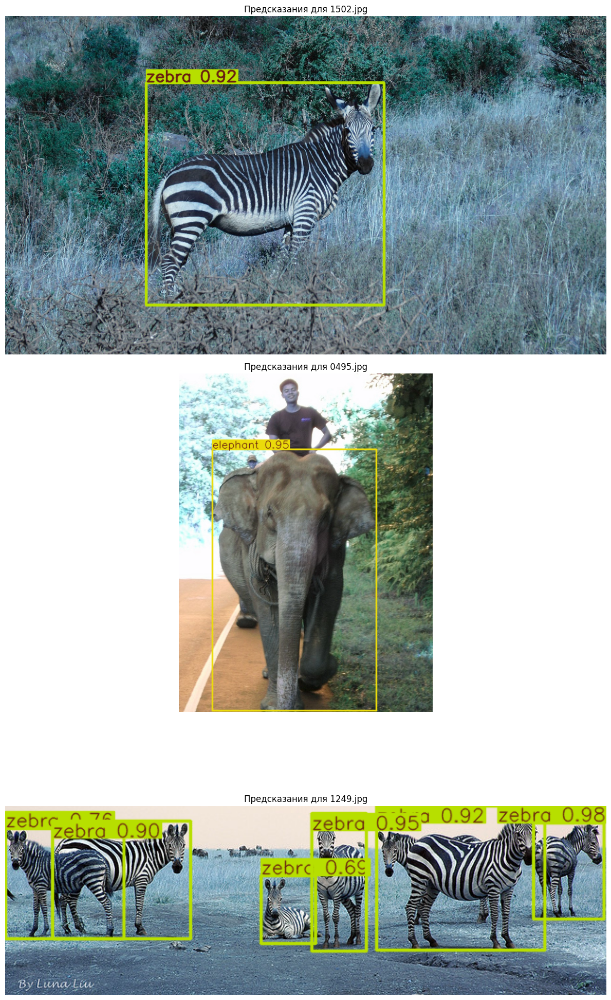

In [53]:
best_model_path_optimized = 'african_wildlife_detection/yolo11n_optimized2/weights/best.pt'

prediction_model = visualize_predictions(
    model_path=best_model_path_optimized,
    num_images=3,
    conf_threshold=0.3
)

Валидация базовой модели...
Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 100 layers, 2,582,932 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2150.9±1875.5 MB/s, size: 350.1 KB)


val: Scanning /home/jupyter/.cache/kagglehub/datasets/ankanghosh651/object-detection-wildlife-dataset-yolo-format/versions/1/final_data/valid/labels.cache... 150 images, 0 backgrounds, 0 corrupt: 100%|██████████| 150/150 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.48it/s]


                   all        150        262      0.944      0.911      0.955      0.809
               buffalo         38         60      0.929      0.872      0.915      0.775
              elephant         43         83      0.936      0.916      0.967      0.782
                 rhino         42         58      0.945      0.966      0.991      0.899
                 zebra         28         61      0.965      0.891      0.946      0.781
Speed: 0.8ms preprocess, 3.5ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/val8
Валидация улучшенной модели...
Ultralytics 8.3.129 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 100 layers, 2,582,932 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1897.5±1743.5 MB/s, size: 274.4 KB)


val: Scanning /home/jupyter/.cache/kagglehub/datasets/ankanghosh651/object-detection-wildlife-dataset-yolo-format/versions/1/final_data/valid/labels.cache... 150 images, 0 backgrounds, 0 corrupt: 100%|██████████| 150/150 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:03<00:00,  2.54it/s]


                   all        150        262      0.934      0.918      0.958      0.831
               buffalo         38         60      0.929      0.933      0.931      0.823
              elephant         43         83      0.899      0.952      0.973      0.805
                 rhino         42         58      0.982      0.966      0.993      0.927
                 zebra         28         61      0.926      0.822      0.933      0.769
Speed: 0.5ms preprocess, 3.6ms inference, 0.0ms loss, 5.1ms postprocess per image
Results saved to runs/detect/val9

Сравнение метрик:
  Метрика  Базовая модель  Улучшенная модель  Изменение (%)
    mAP50          0.9549             0.9575         0.2756
 mAP50-95          0.8093             0.8310         2.6855
Precision          0.9436             0.9341        -1.0032
   Recall          0.9111             0.9183         0.7949


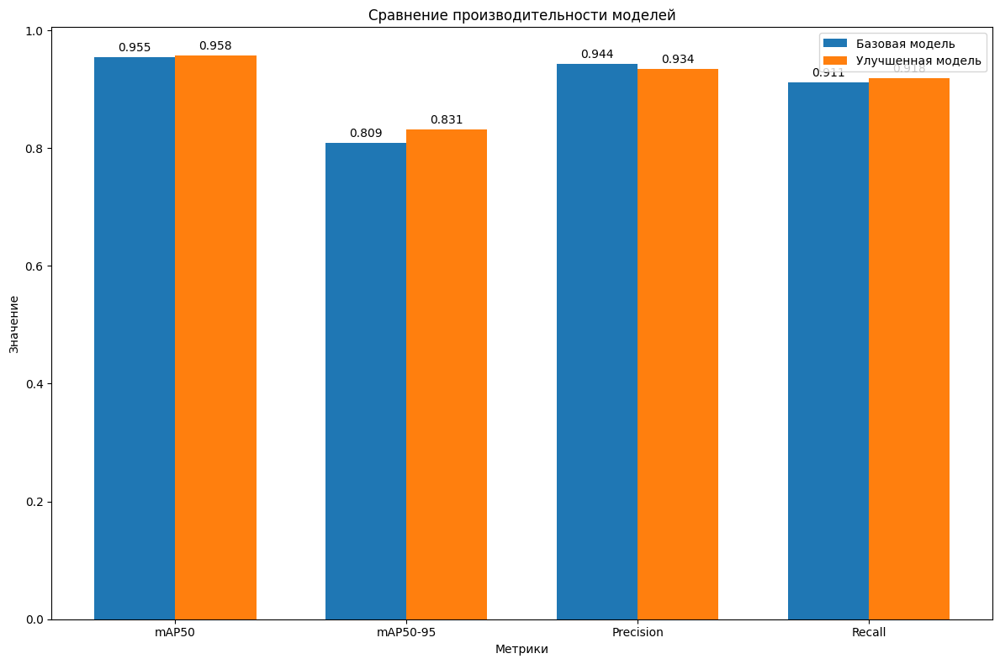

In [ ]:
def compare_models(base_model_path, improved_model_path, data_yaml_path):
    base_model = YOLO(base_model_path)
    improved_model = YOLO(improved_model_path)
    base_results = base_model.val(data=data_yaml_path)
    improved_results = improved_model.val(data=data_yaml_path)

    base_metrics = {
        'mAP50': float(base_results.box.map50),
        'mAP50-95': float(base_results.box.map),
        'Precision': float(np.mean(base_results.box.p)),
        'Recall': float(np.mean(base_results.box.r)),
    }

    improved_metrics = {
        'mAP50': float(improved_results.box.map50),
        'mAP50-95': float(improved_results.box.map),
        'Precision': float(np.mean(improved_results.box.p)),
        'Recall': float(np.mean(improved_results.box.r)),
    }

    metrics_df = pd.DataFrame({
        'Метрика': list(base_metrics.keys()),
        'Базовая модель': list(base_metrics.values()),
        'Улучшенная модель': list(improved_metrics.values()),
        'Изменение (%)': [(improved_metrics[key] - base_metrics[key]) / base_metrics[key] * 100
                        for key in base_metrics.keys()]
    })

    print("\nСравнение метрик:")
    print(metrics_df.to_string(index=False, float_format=lambda x: f'{x:.4f}'))

    plt.figure(figsize=(12, 8))

    x = np.arange(len(base_metrics))
    width = 0.35

    plt.bar(x - width/2, list(base_metrics.values()), width, label='Базовая модель')
    plt.bar(x + width/2, list(improved_metrics.values()), width, label='Улучшенная модель')

    plt.xlabel('Метрики')
    plt.ylabel('Значение')
    plt.title('Сравнение производительности моделей')
    plt.xticks(x, list(base_metrics.keys()))
    plt.legend()

    for i, v in enumerate(base_metrics.values()):
        plt.text(i - width/2, v + 0.01, f'{v:.3f}', ha='center')

    for i, v in enumerate(improved_metrics.values()):
        plt.text(i + width/2, v + 0.01, f'{v:.3f}', ha='center')

    plt.tight_layout()
    plt.show()

    return base_results, improved_results, metrics_df


base_results, improved_results, metrics_df = compare_models(best_model_path, best_model_path_optimized, YAML_PATH)


Улучшенная модель показывает небольшое преимущество в mAP50 и mAP50-95, демонстрируя лучшую точность детекции объектов. Однако, по метрике Precision базовая модель незначительно превышает улучшенную, указывая на меньшее количество ложных положительных предсказаний. Оба варианта одинаковы по Recall, что говорит об их равной способности обнаруживать истинные положительные случаи.

### Собственная имплементация

Достанем все фотографии из датасета, чтобы использовать совй формат, а не yolo

In [51]:
def read_annotation(txt_path):
    with open(txt_path, 'r') as f:
        lines = f.readlines()

    annotations = []
    for line in lines:
        values = line.strip().split()
        class_id = int(values[0])
        x_center = float(values[1])
        y_center = float(values[2])
        width = float(values[3])
        height = float(values[4])

        annotations.append((class_id, x_center, y_center, width, height))

    return annotations

def load_detection_dataset(dataset_path, num_classes, img_size):
    train_path = os.path.join(dataset_path, 'train')

    image_paths = []
    for ext in ['*.jpg', '*.jpeg', '*.png']:
        image_paths.extend(glob.glob(os.path.join(train_path, 'images', ext)))

    image_paths = sorted(image_paths)[:200]

    X = []
    y = []

    for img_path in tqdm(image_paths, desc="Загрузка данных"):
        label_path = img_path.replace('images', 'labels').rsplit('.', 1)[0] + '.txt'


        if not os.path.exists(label_path):
            continue

        img = cv2.imread(img_path)
        if img is None:
            continue

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, img_size)

        img = img / 255.0


        annotations = read_annotation(label_path)
        if annotations:
            class_id, x_center, y_center, width, height = annotations[0]
            target = np.zeros(num_classes + 4)
            target[class_id] = 1.0
            target[num_classes:] = [x_center, y_center, width, height]
            X.append(img)
            y.append(target)

    X = np.array(X, dtype=np.float32)
    y = np.array(y, dtype=np.float32)
    return X, y


разобъём на выьорки

In [52]:
img_size = (320, 320)
X, y = load_detection_dataset(DATASET_PATH, num_classes=4, img_size=img_size)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Форма обучающих данных: {X_train.shape}")
print(f"Форма целевых данных: {y_train.shape}")


Загрузка данных:   0%|          | 0/200 [00:00<?, ?it/s]

Загрузка данных: 100%|██████████| 200/200 [00:04<00:00, 43.16it/s]


Форма обучающих данных: (160, 320, 320, 3)
Форма целевых данных: (160, 8)


опишем кастомную модель

In [53]:
def create_detection_model(input_shape, num_classes):
    base_model = MobileNetV2(
        include_top=False,
        weights='imagenet',
        input_shape=input_shape
    )

    base_model.trainable = False

    x = base_model.output
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.3)(x)

    class_output = layers.Dense(num_classes, activation='softmax', name='class_output')(x)
    box_output = layers.Dense(4, activation='sigmoid', name='box_output')(x)

    model = models.Model(inputs=base_model.input, outputs=[class_output, box_output])

    return model

input_shape = X_train[0].shape
num_classes = 4
model = create_detection_model(input_shape, num_classes)

model.summary()


Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 320, 320, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 160, 160, 32  864         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 160, 160, 32  128         ['Conv1[0][0]']                  
                                )                                                           

опишем функции потерь для предсказания класса и его детекции

In [54]:
def bbox_iou(boxes1, boxes2):
    boxes1_x1 = boxes1[..., 0] - boxes1[..., 2] / 2
    boxes1_y1 = boxes1[..., 1] - boxes1[..., 3] / 2
    boxes1_x2 = boxes1[..., 0] + boxes1[..., 2] / 2
    boxes1_y2 = boxes1[..., 1] + boxes1[..., 3] / 2

    boxes2_x1 = boxes2[..., 0] - boxes2[..., 2] / 2
    boxes2_y1 = boxes2[..., 1] - boxes2[..., 3] / 2
    boxes2_x2 = boxes2[..., 0] + boxes2[..., 2] / 2
    boxes2_y2 = boxes2[..., 1] + boxes2[..., 3] / 2

    intersect_x1 = tf.maximum(boxes1_x1, boxes2_x1)
    intersect_y1 = tf.maximum(boxes1_y1, boxes2_y1)
    intersect_x2 = tf.minimum(boxes1_x2, boxes2_x2)
    intersect_y2 = tf.minimum(boxes1_y2, boxes2_y2)

    intersect_width = tf.maximum(0.0, intersect_x2 - intersect_x1)
    intersect_height = tf.maximum(0.0, intersect_y2 - intersect_y1)
    intersect_area = intersect_width * intersect_height

    boxes1_area = (boxes1_x2 - boxes1_x1) * (boxes1_y2 - boxes1_y1)
    boxes2_area = (boxes2_x2 - boxes2_x1) * (boxes2_y2 - boxes2_y1)

    union_area = boxes1_area + boxes2_area - intersect_area

    iou = intersect_area / (union_area + 1e-7)

    return iou


def iou_loss(y_true, y_pred):
    iou = bbox_iou(y_true, y_pred)

    loss = 1.0 - iou
    return loss

def box_iou_loss(y_true, y_pred):
    mse_loss = tf.keras.losses.mean_squared_error(y_true, y_pred)

    iou = bbox_iou(y_true, y_pred)
    iou_loss = 1.0 - iou

    return 0.5 * mse_loss + 0.5 * iou_loss

class MeanIoU(tf.keras.metrics.Metric):
    def __init__(self, name='mean_iou', **kwargs):
        super(MeanIoU, self).__init__(name=name, **kwargs)
        self.total_iou = self.add_weight(name='total_iou', initializer='zeros')
        self.count = self.add_weight(name='count', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        iou = bbox_iou(y_true, y_pred)
        self.total_iou.assign_add(tf.reduce_sum(iou))
        self.count.assign_add(tf.cast(tf.shape(y_true)[0], tf.float32))

    def result(self):
        return self.total_iou / (self.count + 1e-7)

    def reset_state(self):
        self.total_iou.assign(0.)
        self.count.assign(0.)


model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss={
        'class_output': 'categorical_crossentropy',
        'box_output': box_iou_loss
    },
    loss_weights={
        'class_output': 1.0,
        'box_output': 5.0
    },
    metrics={
        'class_output': 'accuracy',
        'box_output': MeanIoU()
    }
)

немного уменьшили размер датасета, так как весь не влазит в память машины(

In [55]:
y_train_class = y_train[:, :num_classes]
y_train_box = y_train[:, num_classes:]

y_test_class = y_test[:, :num_classes]
y_test_box = y_test[:, num_classes:]

print(f"Форма данных для классификации: {y_train_class.shape}")
print(f"Форма данных для обнаружения объектов: {y_train_box.shape}")


Форма данных для классификации: (160, 4)
Форма данных для обнаружения объектов: (160, 4)


обучим модель

In [75]:
model.fit(
    X_train,
    {'class_output': y_train_class, 'box_output': y_train_box},
    validation_split=0.2,
    epochs=2,
    batch_size=16,
)


Epoch 1/2
8/8 [==============================] - 0s 62ms/step - loss: 0.8020 - class_output_loss: 0.0172 - box_output_loss: 0.1570 - class_output_accuracy: 1.0000 - box_output_mean_iou: 0.6924 - val_loss: 0.8011 - val_class_output_loss: 0.0133 - val_box_output_loss: 0.1576 - val_class_output_accuracy: 1.0000 - val_box_output_mean_iou: 0.6926
Epoch 2/2
8/8 [==============================] - 0s 51ms/step - loss: 0.7976 - class_output_loss: 0.0193 - box_output_loss: 0.1557 - class_output_accuracy: 1.0000 - box_output_mean_iou: 0.6953 - val_loss: 0.8535 - val_class_output_loss: 0.0126 - val_box_output_loss: 0.1682 - val_class_output_accuracy: 1.0000 - val_box_output_mean_iou: 0.6724


In [62]:
def visualize_detection(image, class_pred, box_pred, class_mapping):
    """Визуализация результатов детекции объектов"""
    plt.figure(figsize=(10, 10))

    # Отображаем изображение
    plt.imshow(image)

    class_id = np.argmax(class_pred)
    class_name = class_mapping[class_id]
    x_center, y_center, width, height = box_pred

    h, w = image.shape[:2]
    x1 = int((x_center - width/2) * w)
    y1 = int((y_center - height/2) * h)
    x2 = int((x_center + width/2) * w)
    y2 = int((y_center + height/2) * h)

    class2color = {
        'buffalo': 'green',
        'elephant': 'blue',
        'rhino': 'red',
        'zebra': 'yellow'
    }
    plt.gca().add_patch(plt.Rectangle((x1, y1), x2-x1, y2-y1, fill=False, color=class2color[class_name], linewidth=2))


    plt.text(x1, y1-10, f"{class_name}", color=class2color[class_name], fontsize=12,
             bbox=dict(facecolor='white', alpha=0.7))

    plt.axis('off')
    plt.title(f"Обнаружен объект: {class_name}")
    plt.show()

In [76]:
def display_sample_predictions(model, num_samples=2):
    np.random.seed(33)
    indices = np.random.choice(len(X_test), num_samples, replace=False)

    for idx in indices:
        img = X_test[idx]

        class_pred, box_pred = model.predict(np.expand_dims(img, axis=0))
        class_pred = class_pred[0]
        box_pred = box_pred[0]

        visualize_detection(img, class_pred, box_pred, classes)

        true_class = np.argmax(y_test_class[idx])
        true_box = y_test_box[idx]

        print(f"Истинный класс: {classes[true_class]}")
        print(f"Истинные координаты: x={true_box[0]:.3f}, y={true_box[1]:.3f}, w={true_box[2]:.3f}, h={true_box[3]:.3f}")
        print(f"Предсказанный класс: {classes[np.argmax(class_pred)]}")
        print(f"Предсказанные координаты: x={box_pred[0]:.3f}, y={box_pred[1]:.3f}, w={box_pred[2]:.3f}, h={box_pred[3]:.3f}")
        print("=" * 50)

1/1 [==============================] - 0s 23ms/step


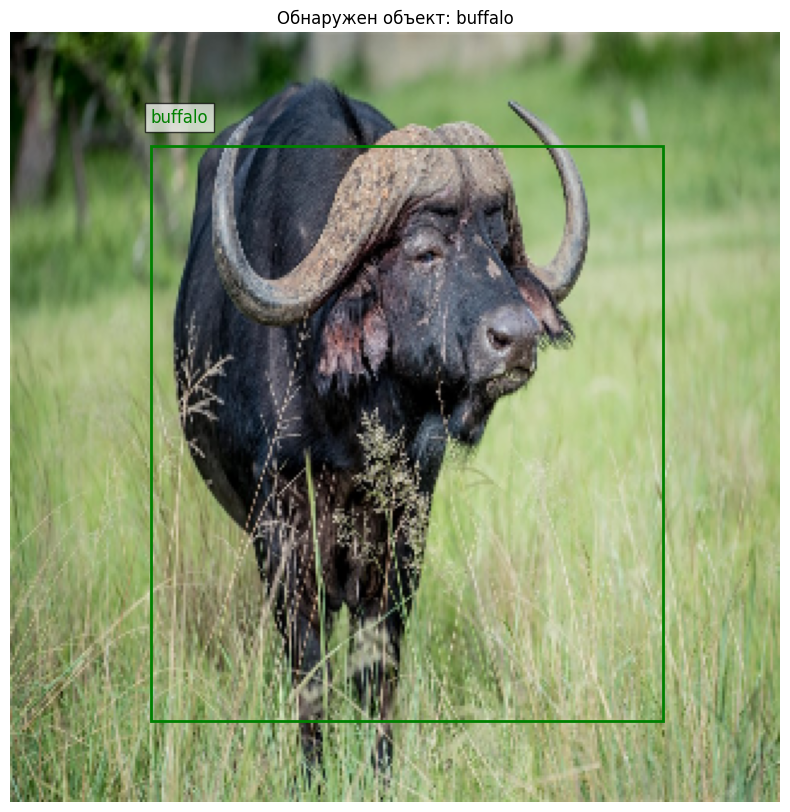

Истинный класс: buffalo
Истинные координаты: x=0.482, y=0.511, w=0.542, h=0.912
Предсказанный класс: buffalo
Предсказанные координаты: x=0.517, y=0.521, w=0.665, h=0.748
1/1 [==============================] - 0s 23ms/step


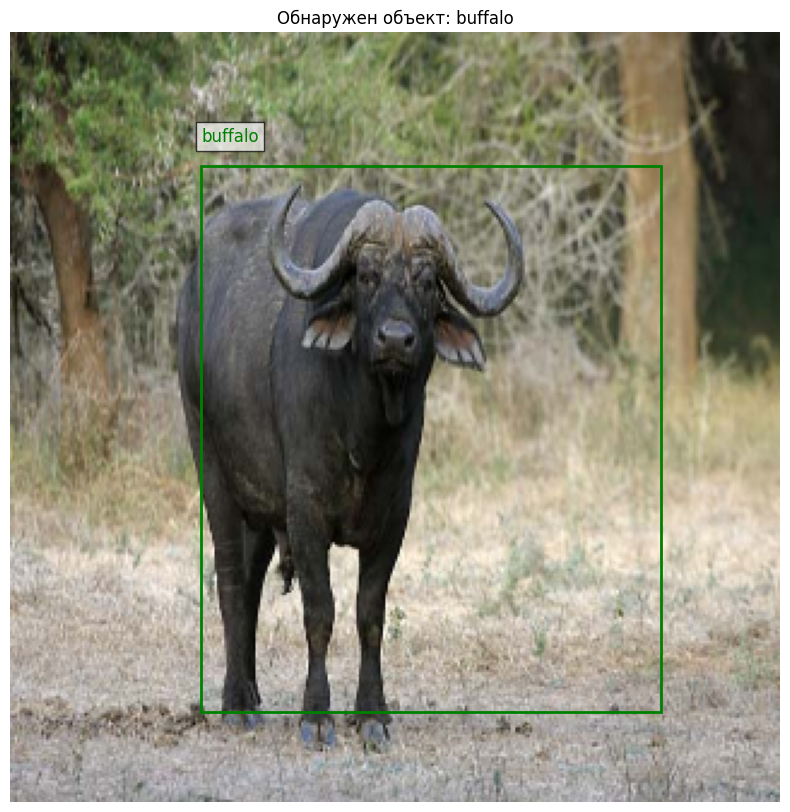

Истинный класс: buffalo
Истинные координаты: x=0.442, y=0.566, w=0.457, h=0.733
Предсказанный класс: buffalo
Предсказанные координаты: x=0.547, y=0.528, w=0.598, h=0.709


In [77]:
display_sample_predictions(model)

Достатоно хороший результат, для такой модели, животные угадываются, и бокс достаточно близко к настоящему положению животных. Попробуем обучать подольше

### Улучшенный бейзлайн собственной имплементаци

Попробуем просто увеличить количество эпох, возможно модель не успела дообучиться

In [78]:
model.fit(
    X_train,
    {'class_output': y_train_class, 'box_output': y_train_box},
    validation_split=0.2,
    epochs=10,
    batch_size=16,
)

Epoch 1/10
8/8 [==============================] - 1s 64ms/step - loss: 0.7397 - class_output_loss: 0.0153 - box_output_loss: 0.1449 - class_output_accuracy: 1.0000 - box_output_mean_iou: 0.7164 - val_loss: 0.7671 - val_class_output_loss: 0.0086 - val_box_output_loss: 0.1517 - val_class_output_accuracy: 1.0000 - val_box_output_mean_iou: 0.7047
Epoch 2/10
8/8 [==============================] - 0s 52ms/step - loss: 0.7159 - class_output_loss: 0.0136 - box_output_loss: 0.1405 - class_output_accuracy: 1.0000 - box_output_mean_iou: 0.7250 - val_loss: 0.7796 - val_class_output_loss: 0.0106 - val_box_output_loss: 0.1538 - val_class_output_accuracy: 1.0000 - val_box_output_mean_iou: 0.7003
Epoch 3/10
8/8 [==============================] - 0s 52ms/step - loss: 0.6738 - class_output_loss: 0.0118 - box_output_loss: 0.1324 - class_output_accuracy: 1.0000 - box_output_mean_iou: 0.7411 - val_loss: 0.7128 - val_class_output_loss: 0.0074 - val_box_output_loss: 0.1411 - val_class_output_accuracy: 1.0000

1/1 [==============================] - 0s 22ms/step


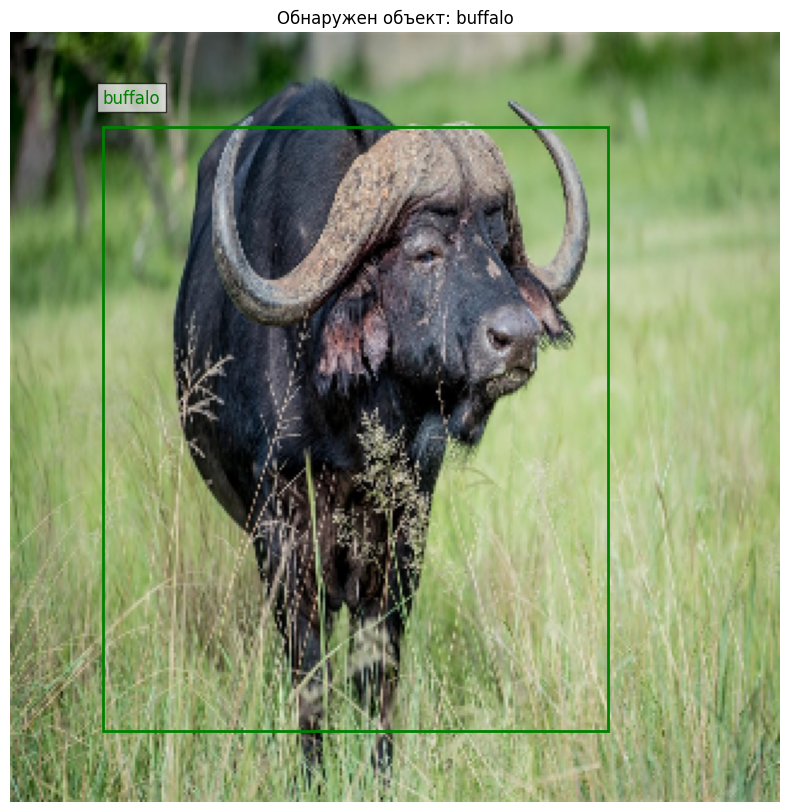

Истинный класс: buffalo
Истинные координаты: x=0.482, y=0.511, w=0.542, h=0.912
Предсказанный класс: buffalo
Предсказанные координаты: x=0.449, y=0.515, w=0.655, h=0.784
1/1 [==============================] - 0s 25ms/step


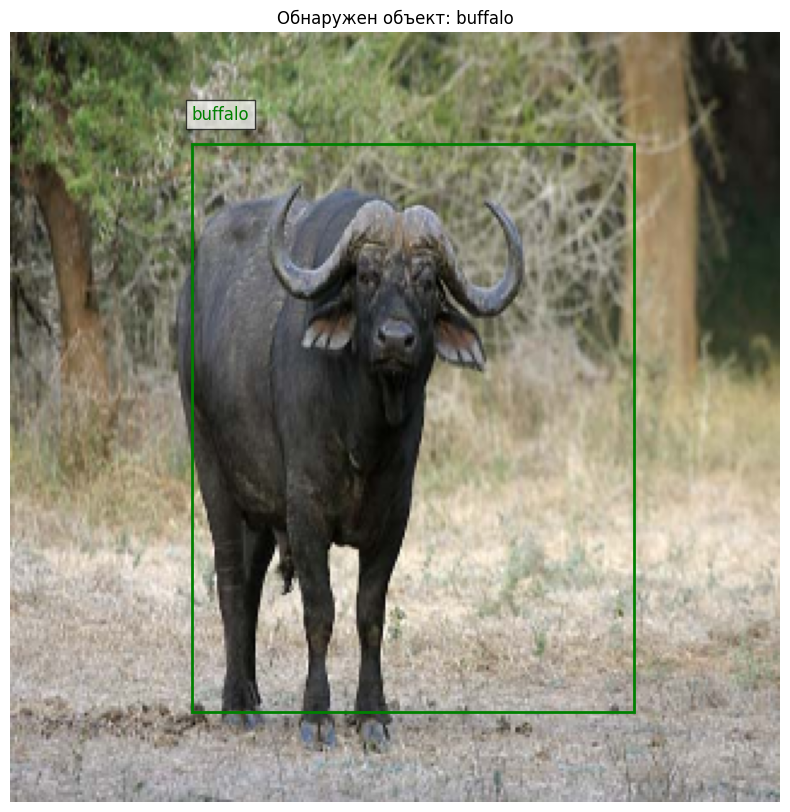

Истинный класс: buffalo
Истинные координаты: x=0.442, y=0.566, w=0.457, h=0.733
Предсказанный класс: buffalo
Предсказанные координаты: x=0.524, y=0.515, w=0.575, h=0.737


In [80]:
display_sample_predictions(model)

Глазами сложно оценить как повлияло дообучение, но судя по метрикам, мы получили дополнительное улучшению, за счет добавления эпох. Хотя и сам датасет не такой уже большой, дальнейшее увеличение числа эпох может негативно сказаться на качестве модели

## Сводная таблица результатов

<table>
  <thead>
    <tr>
      <th>Архитектура</th>
      <th>Модификация</th>
      <th>Улучшенная</th>
      <th>mAP50</th>
      <th>mAP50-95</th>
    </tr>
  </thead>
  <tbody>
    <tr>
      <td>Yolo</td>
      <td>Стандартная</td>
      <td>Нет</td>
      <td>0.948</td>
      <td>0.78</td>
    </tr>
    <tr>
      <td>Yolo</td>
      <td>Стандартная</td>
      <td>Да</td>
      <td>0.934</td>
      <td>0.771</td>
    </tr>
    <tr>
      <td>Yolo</td>
      <td>Кастомная</td>
      <td>Нет</td>
      <td>0.6953</td>
      <td>0.5731</td>
    </tr>
    <tr>
      <td>Yolo</td>
      <td>Кастомная</td>
      <td>Да</td>
      <td>0.7321</td>
      <td>0.6166</td>
    </tr>
  </tbody>
</table>



# Заключение


В этой работе проведена детекция и классификация животных в дикой среде с использованием архитектуры YOLO. Анализируя метрики mAP50 и mAP50-95, можно сделать следующие выводы: стандартная архитектура YOLO без улучшений показала наилучшие результаты с mAP50 0.948 и mAP50-95 0.78. Это свидетельствует о её высокой эффективности для данной задачи. Улучшенные версии стандартной модели YOLO продемонстрировали незначительное снижение метрик (mAP50 0.934 и mAP50-95 0.771), что может быть связано с настройками, которые не дают значительных преимуществ для этого датасета.

Кастомные версии YOLO значительно уступают стандартным по обоим показателям, с mAP50 максимум 0.7321 и mAP50-95 максимум 0.6166. Это говорит о том, что внесенные изменения могут быть неэффективными для данной задачи или требуют дополнительной оптимизации. Общая рекомендация заключается в упоре на стандартные модели YOLO для точности, с возможностью дальнейшей адаптации и тестирования кастомных версий для улучшения результатов.